Author: Tuwe Löfström (tuwe.lofstrom@ju.se)  
Copyright 2023 Tuwe Löfström  
License: BSD 3 clause

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import warnings

import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split

from calibrated_explanations import CalibratedExplainer, VennAbers, __version__

warnings.filterwarnings("ignore")

print(f"calibrated_explanations {__version__}")

calibrated_explanations v0.10.2


C:\Users\loftuw\CUDATemp\ipykernel_44244\3857979616.py:9: DeprecationWarning: 
'VennAbers' imported from top level is deprecated and will be removed in v0.11.0.
  ❌ DEPRECATED: from calibrated_explanations import VennAbers
  ✓ RECOMMENDED: from calibrated_explanations.calibration import VennAbers

  Details: Calibrators are domain components; import from the calibration submodule.

See https://calibrated-explanations.readthedocs.io/en/latest/migration/api_surface_narrowing.html for migration guide.
  from calibrated_explanations import CalibratedExplainer, VennAbers, __version__


In [3]:
dataset = "glass"
delimiter = ","
num_to_test = 24
print(dataset)

filename = "../data/Multiclass/" + dataset + ".csv"
df = pd.read_csv(filename, delimiter=delimiter)
target = "Type"

df = df.dropna()
categorical_features = []
categorical_labels = {}
for c, col in enumerate(df.columns):
    if df[col].dtype == object:
        df[col] = df[col].str.replace("'", "")
        df[col] = df[col].str.replace('"', "")
        if col != target:
            categorical_features.append(c)
            categorical_labels[c] = dict(zip(range(len(np.unique(df[col]))), np.unique(df[col])))
        else:
            target_labels = dict(zip(range(len(np.unique(df[col]))), np.unique(df[col])))
        mapping = dict(zip(np.unique(df[col]), range(len(np.unique(df[col])))))
        if len(mapping) > 5:
            counts = df[col].value_counts().sort_values(ascending=False)
            id = 0
            for key, count in counts.items():
                if count > 5:
                    id += 1
                    continue
                mapping[key] = id
        df[col] = df[col].map(mapping)
print(target_labels)

glass
{0: 'build wind float', 1: 'build wind non-float', 2: 'containers', 3: 'headlamps', 4: 'tableware', 5: 'vehic wind float'}


In [4]:
df.head()

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type
0,1.51793,12.79,3.50,1.12,73.03,0.64,8.77,0.0,0.00,0
1,1.51643,12.16,3.52,1.35,72.89,0.57,8.53,0.0,0.00,5
2,1.51793,13.21,3.48,1.41,72.64,0.59,8.43,0.0,0.00,0
3,1.51299,14.40,1.74,1.54,74.55,0.00,7.59,0.0,0.00,4
4,1.53393,12.30,0.00,1.00,70.16,0.12,16.19,0.0,0.24,1


In [5]:
X, y = df.drop(target, axis=1), df[target]
no_of_classes = len(np.unique(y))
no_of_features = X.shape[1]
no_of_instances = X.shape[0]
# sort targets to make sure equal presence of both classes in test set (see definition of test_index after outer loop below)
idx = np.argsort(y.values).astype(int)
X, y = X.values[idx, :], y.values[idx]
test_idx = []
idx = list(range(no_of_instances))
for i in range(no_of_classes):
    test_idx.append(np.where(y == i)[0][0 : int(num_to_test / no_of_classes)])
test_index = np.array(test_idx).flatten()
# Select num_to_test/2 from top and num_to_test/2 from bottom of list of instances
train_index = np.setdiff1d(np.array(range(no_of_instances)), test_index)
X_train, X_test = X[train_index, :], X[test_index, :]
y_train, y_test = y[train_index], y[test_index]
X_prop_train, X_cal, y_prop_train, y_cal = train_test_split(
    X_train, y_train, test_size=0.33, random_state=42, stratify=y_train
)
print(y_test)
print(categorical_features)

[0 0 0 0 1 1 1 1 2 2 2 2 3 3 3 3 4 4 4 4 5 5 5 5]
[]


In [6]:
model = RandomForestClassifier(n_estimators=100)
model_name = "RF"
model.fit(X_prop_train, y_prop_train)

RandomForestClassifier()

In [7]:
va = VennAbers(X_cal, y_cal, model)
va_proba, low, high, predicted_classes = va.predict_proba(X_test, output_interval=True)
print(
    *zip(
        [low[i, c] for i, c in enumerate(predicted_classes)],
        [va_proba[i, c] for i, c in enumerate(predicted_classes)],
        [high[i, c] for i, c in enumerate(predicted_classes)],
        y_test,
        predicted_classes,
    ),
    sep="\n",
)

(0.7498170013685115, 0.7591897138856178, 0.8435441265395754, 0, 0)
(0.7106874791313029, 0.7219682327683077, 0.8122142618643462, 0, 0)
(0.7498170013685115, 0.7591897138856178, 0.8435441265395754, 0, 0)
(0.6689723538211882, 0.6968462018970711, 0.8362154422764853, 0, 0)
(0.5473452952965696, 0.5986589167306231, 0.6841816191207121, 1, 1)
(0.313643331630046, 0.4356157383750639, 0.5227388860500767, 1, 1)
(0.3380578958953646, 0.4225723698692057, 0.5070868438430468, 1, 1)
(0.6440245968961541, 0.7044019028551686, 0.8050307461201927, 1, 1)
(0.5419964910257572, 0.6097460524039767, 0.8129947365386357, 2, 3)
(0.35652402519030146, 0.47536536692040193, 0.7130480503806029, 2, 2)
(0.3759465806397982, 0.5012621075197309, 0.7518931612795964, 2, 2)
(0.24392463760608282, 0.3387842188973373, 0.40654106267680473, 2, 1)
(0.8260288065843622, 0.8391403749428441, 0.9440329218106996, 3, 3)
(0.7851304518802467, 0.7975928400053298, 0.8972919450059962, 3, 3)
(0.675, 0.7031250000000001, 0.84375, 3, 3)
(0.7972154813274

In [8]:
print(target_labels, end="\n\nConfusions matrix on test set:\n")

cm = confusion_matrix(y_test, predicted_classes)
print(cm, end="\n\nConfusions matrix on calibration set:\n")

cal_predicted_classes = np.zeros(len(y_cal))
for i in range(len(y_cal)):
    va = VennAbers(
        np.concatenate((X_cal[:i], X_cal[i + 1 :]), axis=0),
        np.concatenate((y_cal[:i], y_cal[i + 1 :])),
        model,
    )
    _, _, _, predict = va.predict_proba([X_cal[i]], output_interval=True)
    cal_predicted_classes[i] = predict[0]
cm = confusion_matrix(y_cal, cal_predicted_classes)

print(cm)

for i in range(no_of_classes):
    print()
    print(f"Class {i} {target_labels[i]}")
    print(f"Precision: {cm[i,i]/np.sum(cm[:,i])}")
    print(f"Recall: {cm[i,i]/np.sum(cm[i,:])}")
    print(f"F1: {2*cm[i,i]/(np.sum(cm[:,i]) + np.sum(cm[i,:]))}")

{0: 'build wind float', 1: 'build wind non-float', 2: 'containers', 3: 'headlamps', 4: 'tableware', 5: 'vehic wind float'}

Confusions matrix on test set:
[[4 0 0 0 0 0]
 [0 4 0 0 0 0]
 [0 1 2 1 0 0]
 [0 0 0 4 0 0]
 [0 0 1 0 3 0]
 [2 1 0 0 0 1]]

Confusions matrix on calibration set:
[[20  1  0  0  0  1]
 [ 3 19  0  1  1  0]
 [ 0  1  2  0  0  0]
 [ 1  0  0  7  0  0]
 [ 0  0  1  0  1  0]
 [ 2  2  0  0  0  0]]

Class 0 build wind float
Precision: 0.7692307692307693
Recall: 0.9090909090909091
F1: 0.8333333333333334

Class 1 build wind non-float
Precision: 0.8260869565217391
Recall: 0.7916666666666666
F1: 0.8085106382978723

Class 2 containers
Precision: 0.6666666666666666
Recall: 0.6666666666666666
F1: 0.6666666666666666

Class 3 headlamps
Precision: 0.875
Recall: 0.875
F1: 0.875

Class 4 tableware
Precision: 0.5
Recall: 0.5
F1: 0.5

Class 5 vehic wind float
Precision: 0.0
Recall: 0.0
F1: 0.0


In [9]:
ce = CalibratedExplainer(
    model,
    X_cal,
    y_cal,
    feature_names=df.columns,
    categorical_features=categorical_features,
    class_labels=target_labels,
)
display(ce)

CalibratedExplainer(mode=classification, learner=RandomForestClassifier())

In [10]:
factual_explanations = ce.explain_factual(X_test)

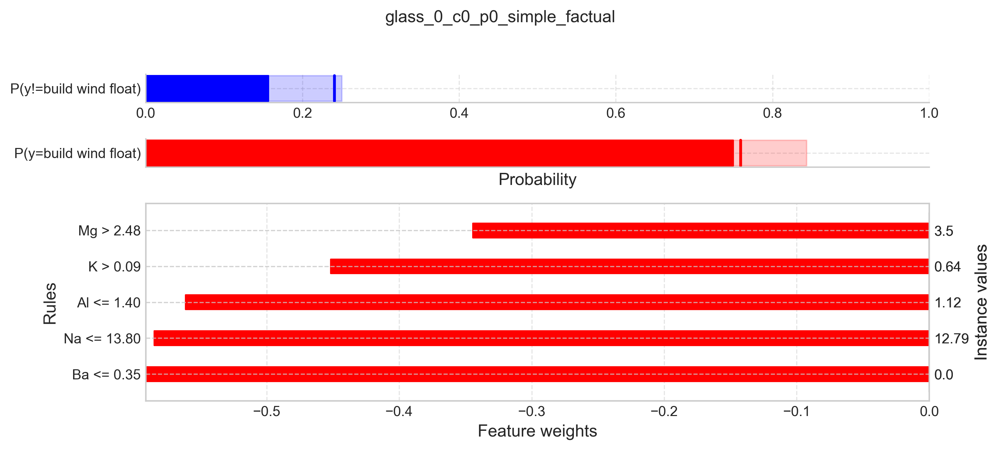

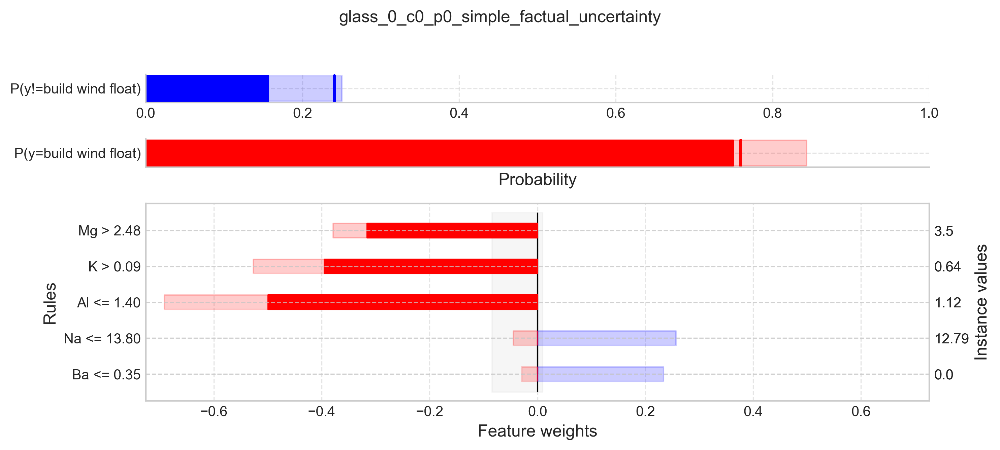

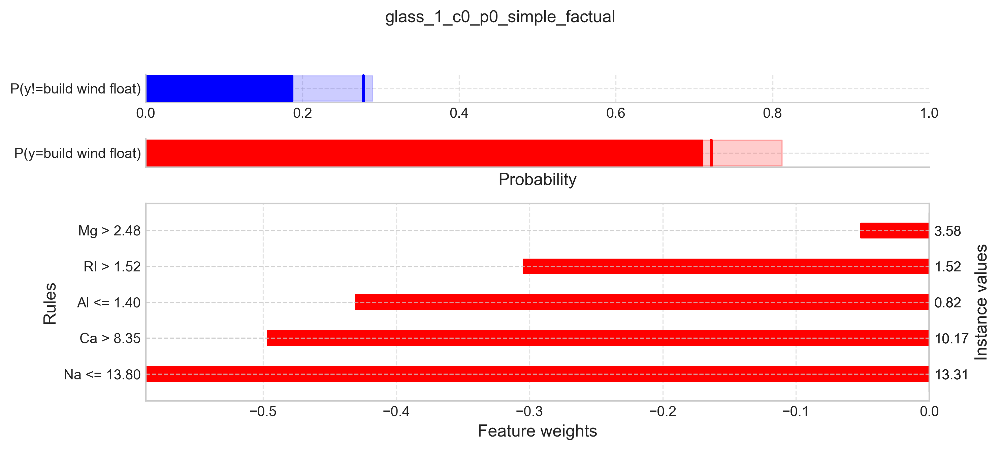

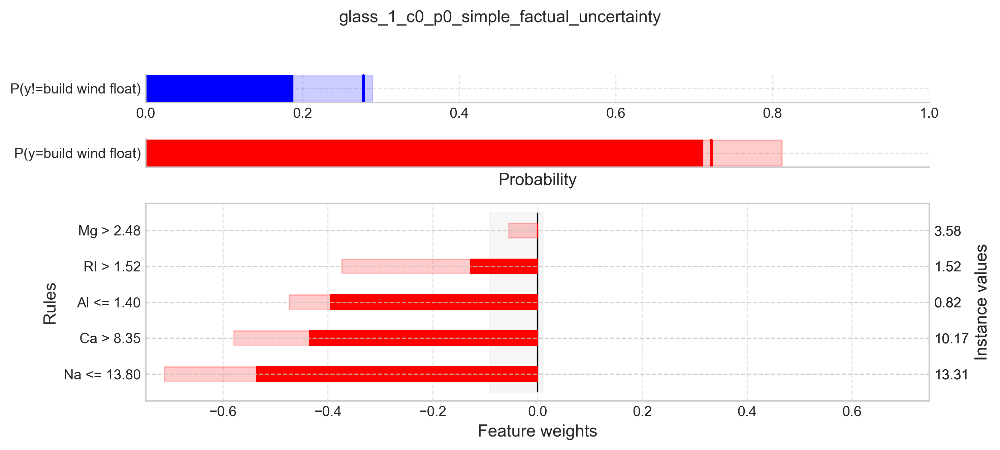

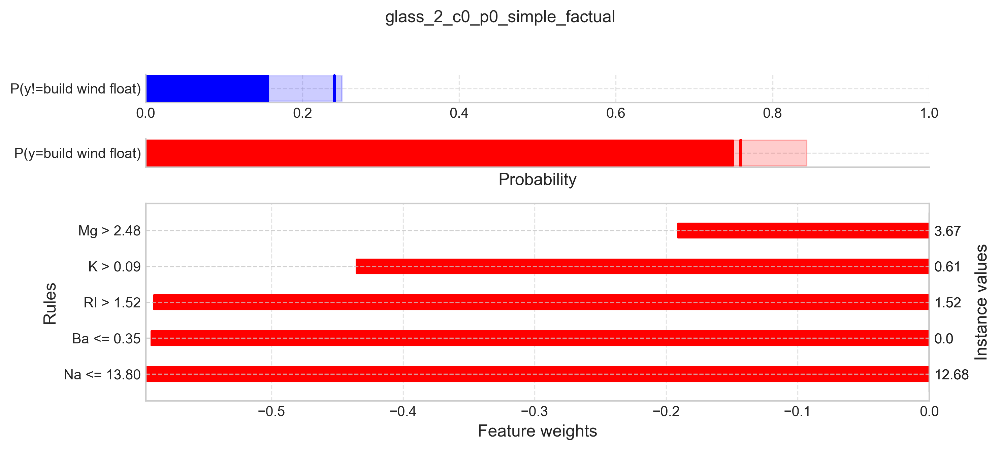

...

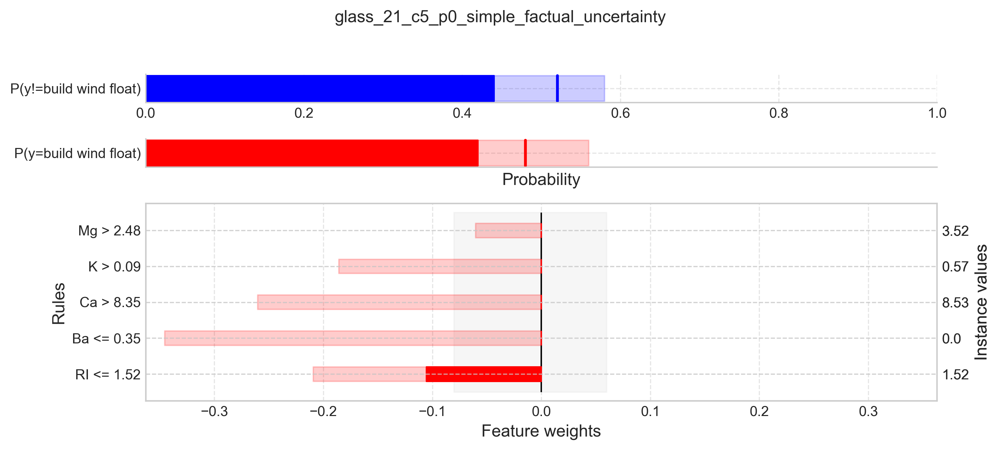

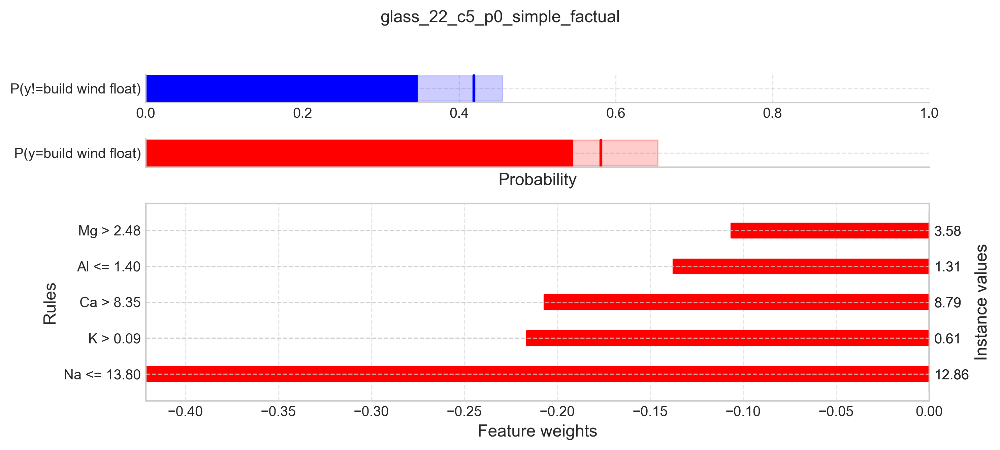

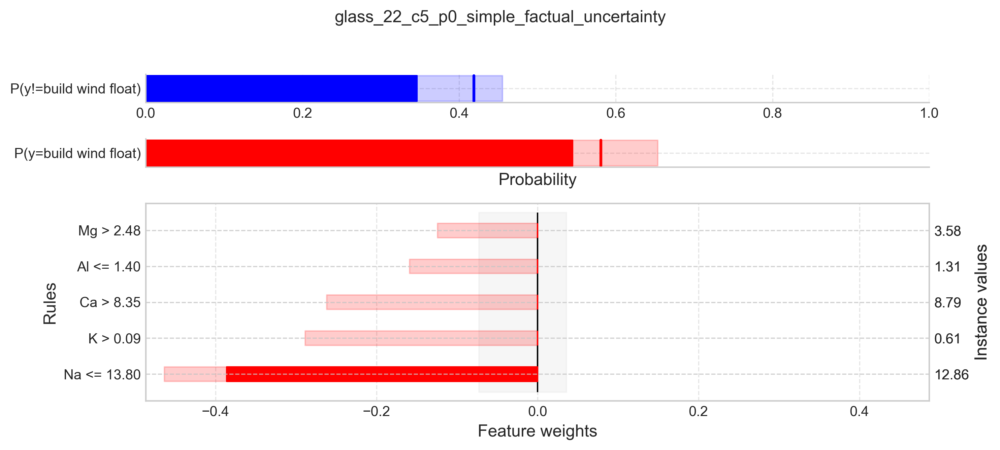

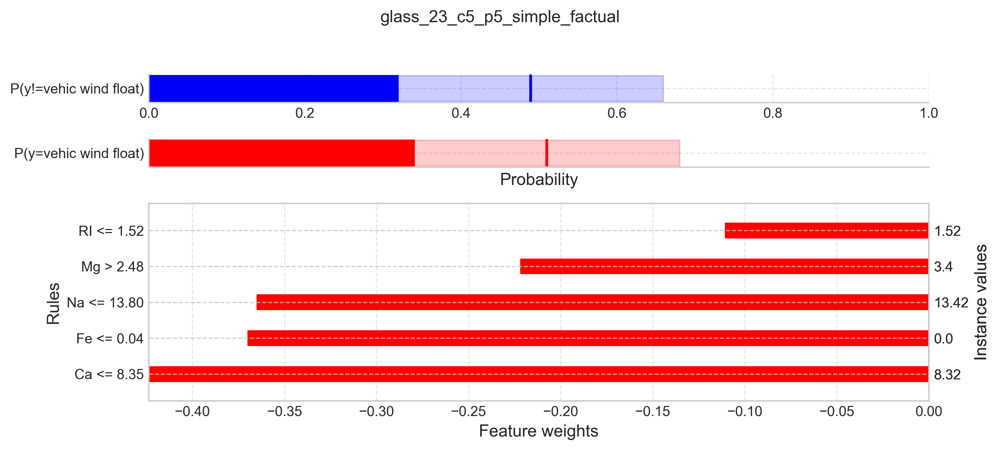

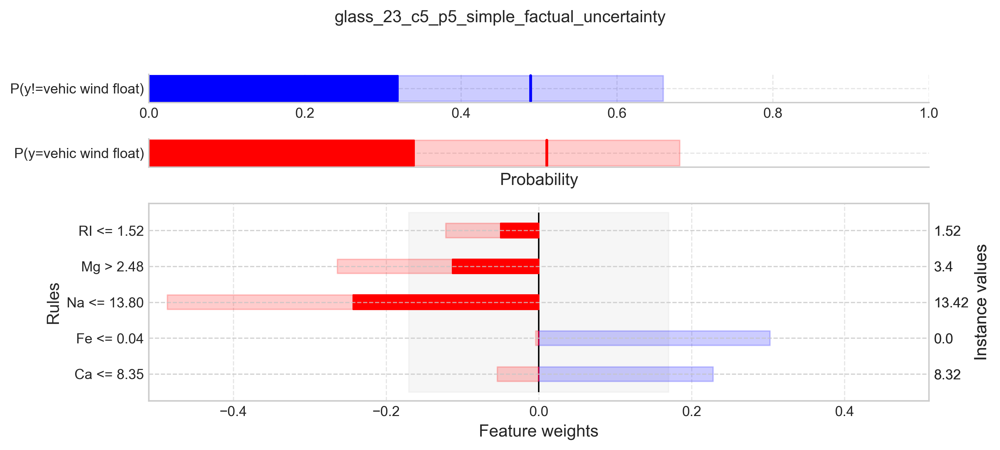

In [11]:
for i in range(num_to_test):
    explanation = factual_explanations.get_explanation(i)
    explanation.plot(
        filter_top=5,
        filename=f"{dataset}_{i}_c{y_test[i]}_p{predicted_classes[i]}_simple_factual.png",
        show=True,
    )
    explanation.plot(
        uncertainty=True,
        filter_top=5,
        filename=f"{dataset}_{i}_c{y_test[i]}_p{predicted_classes[i]}_simple_factual_uncertainty.png",
        show=True,
    )

In [12]:
alternative_explanations = ce.explore_alternatives(X_test)

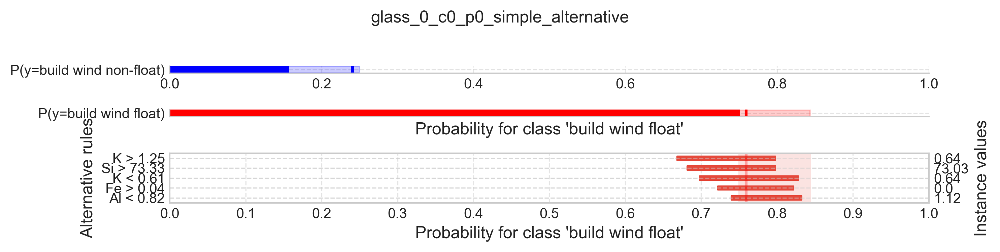

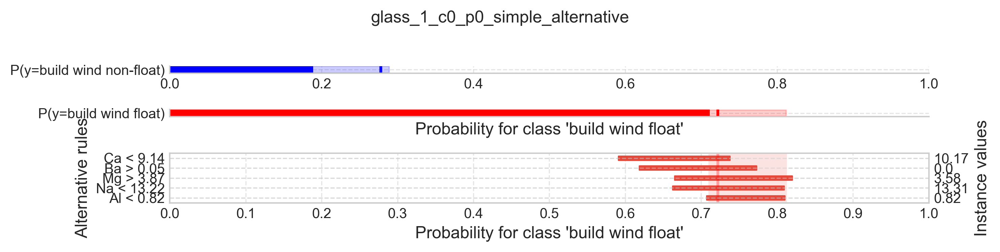

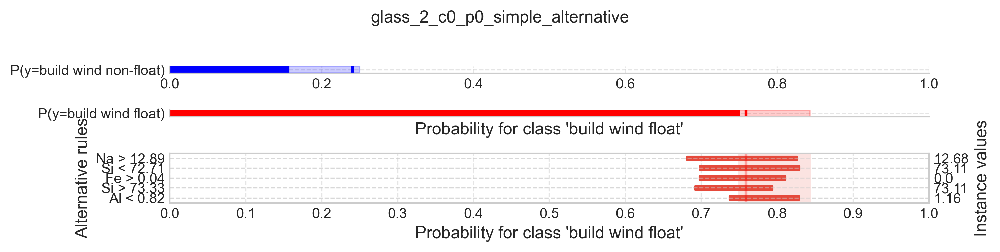

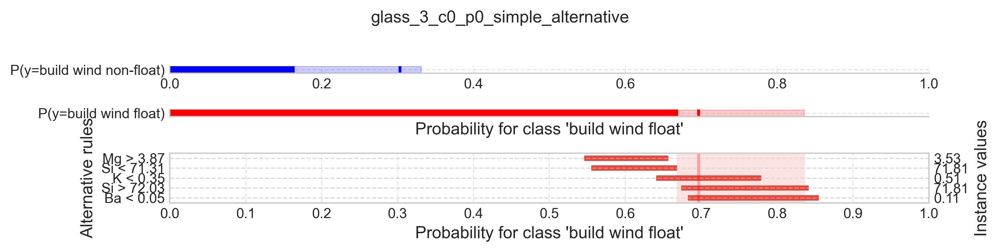

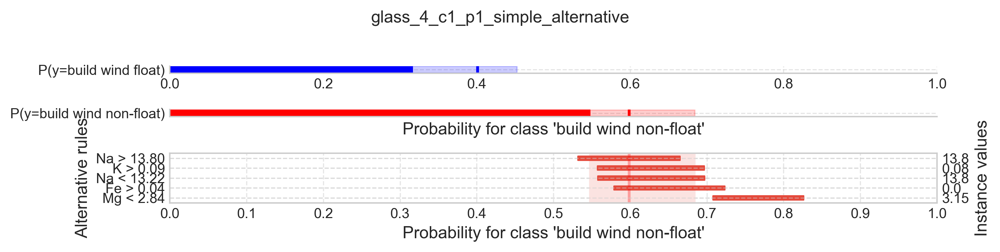

...

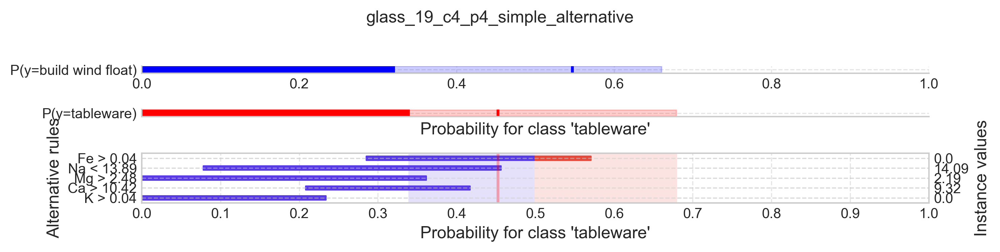

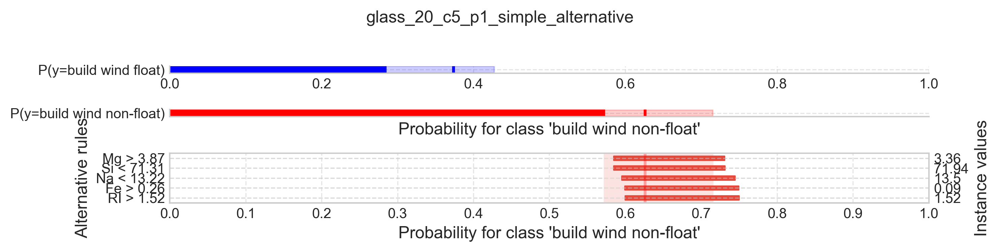

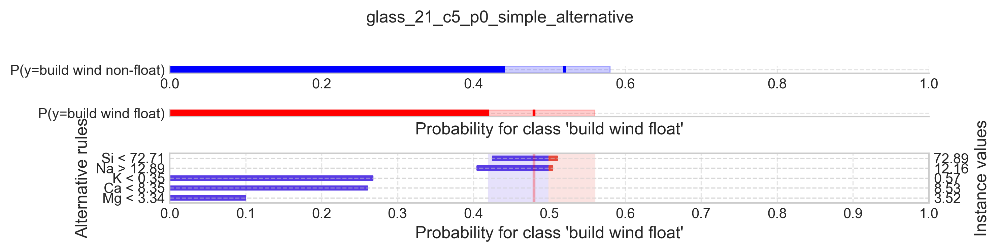

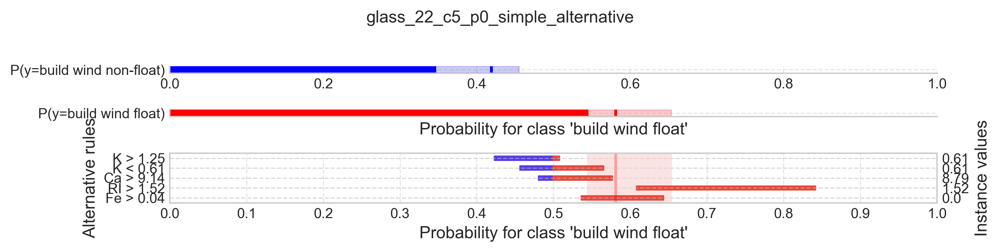

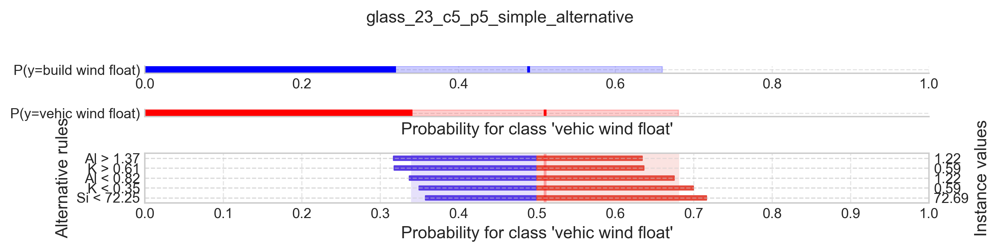

In [13]:
for i in range(num_to_test):
    explanation = alternative_explanations.get_explanation(i)
    explanation.plot(
        filter_top=5,
        filename=f"{dataset}_{i}_c{y_test[i]}_p{predicted_classes[i]}_simple_alternative.png",
        show=True,
    )

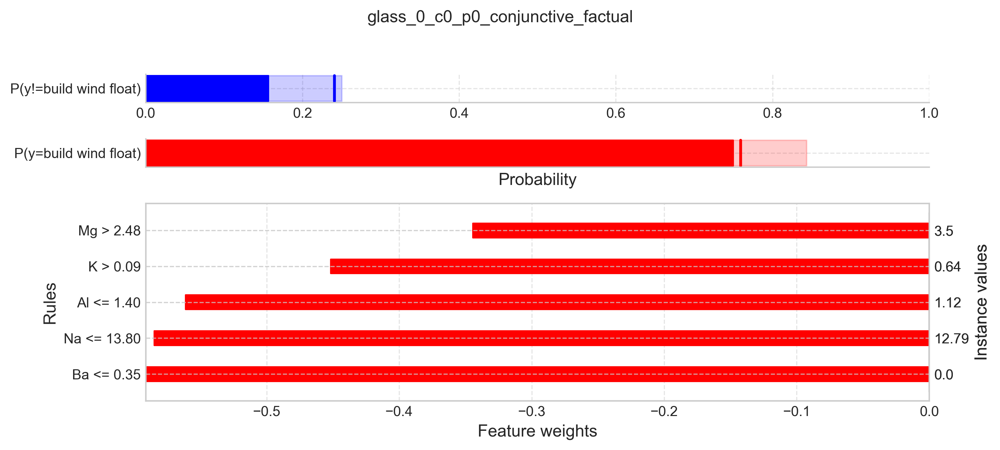

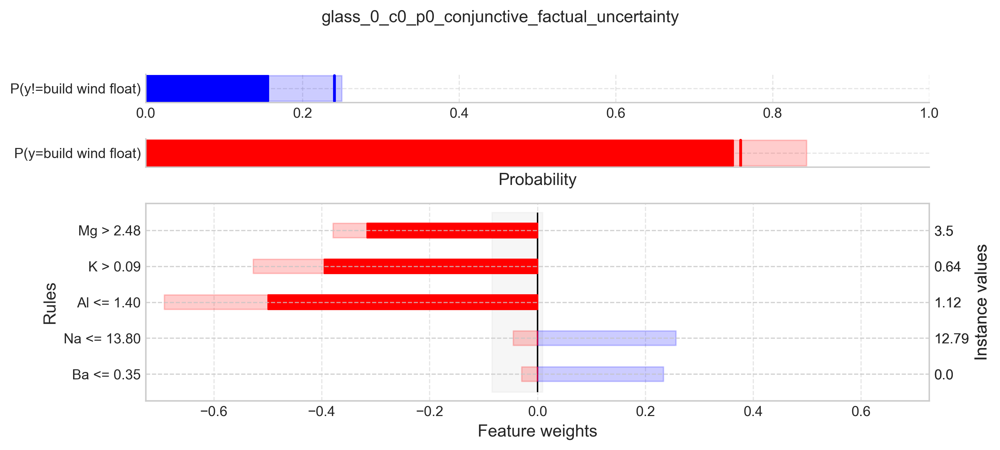

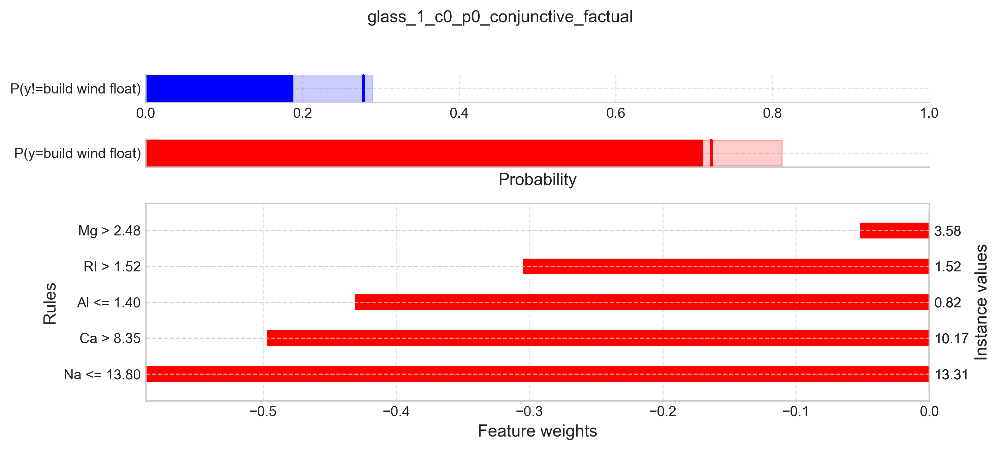

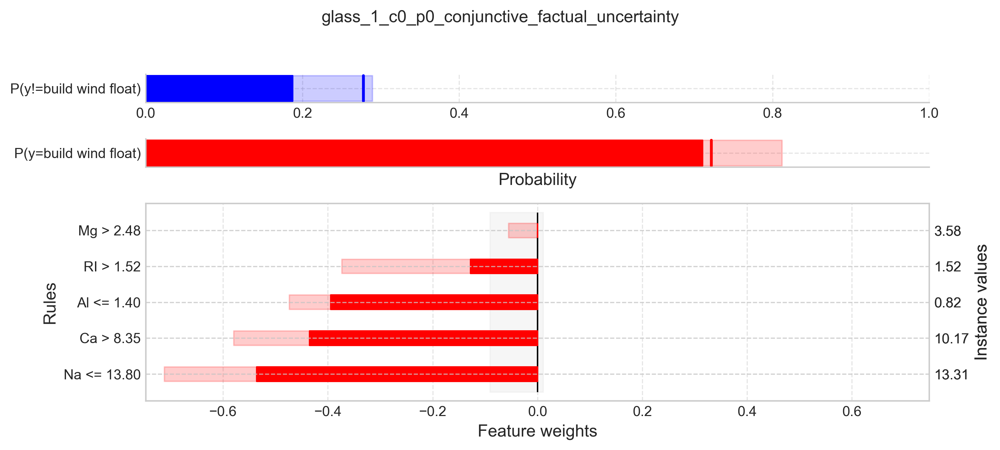

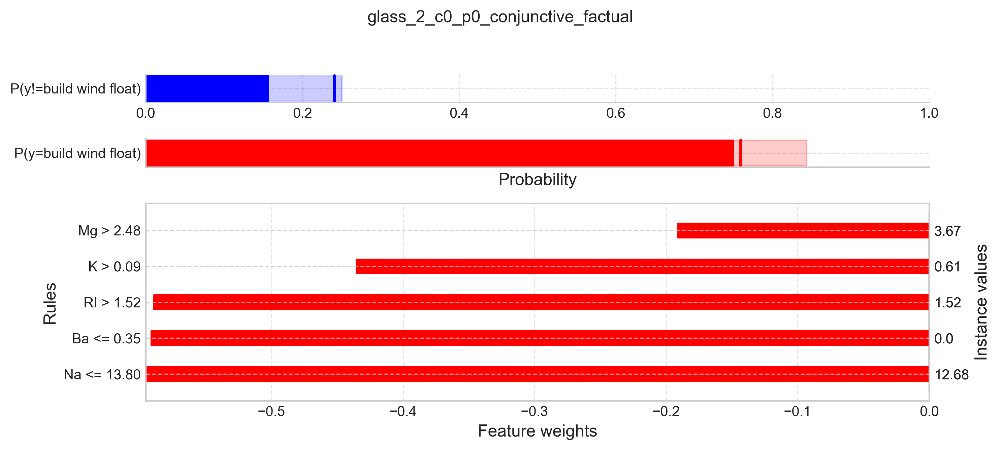

...

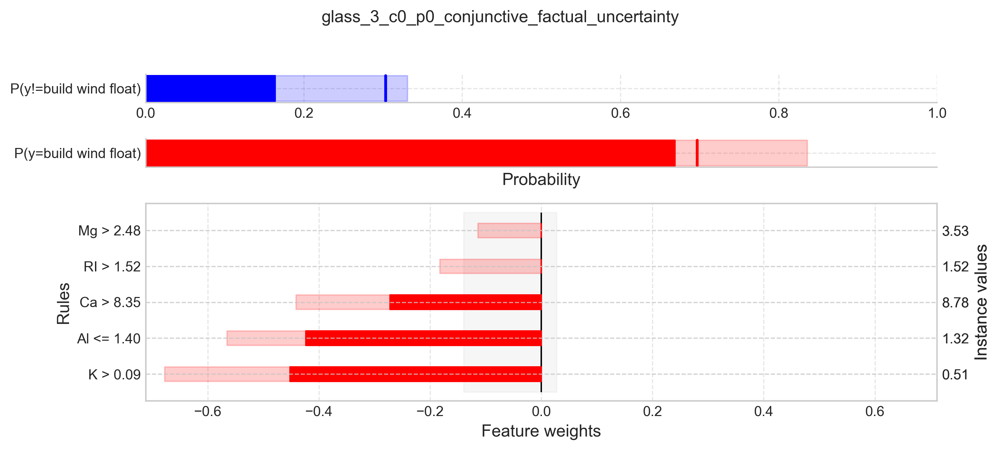

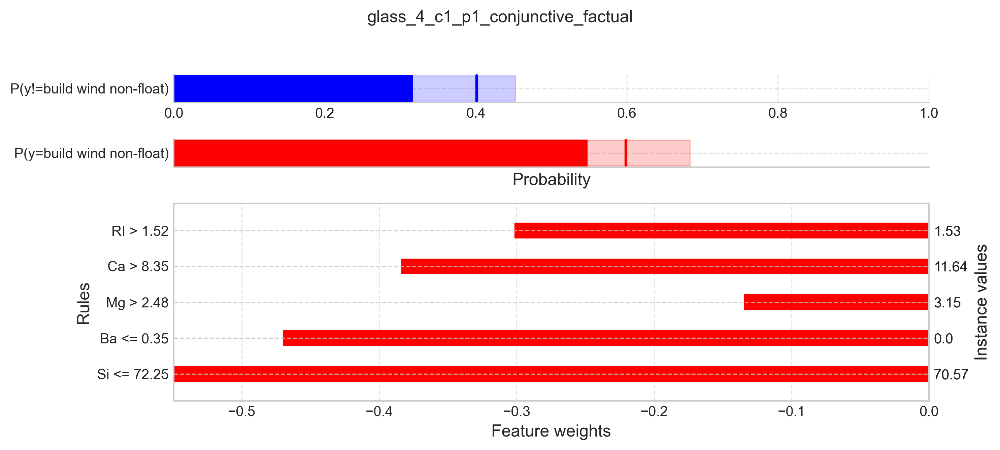

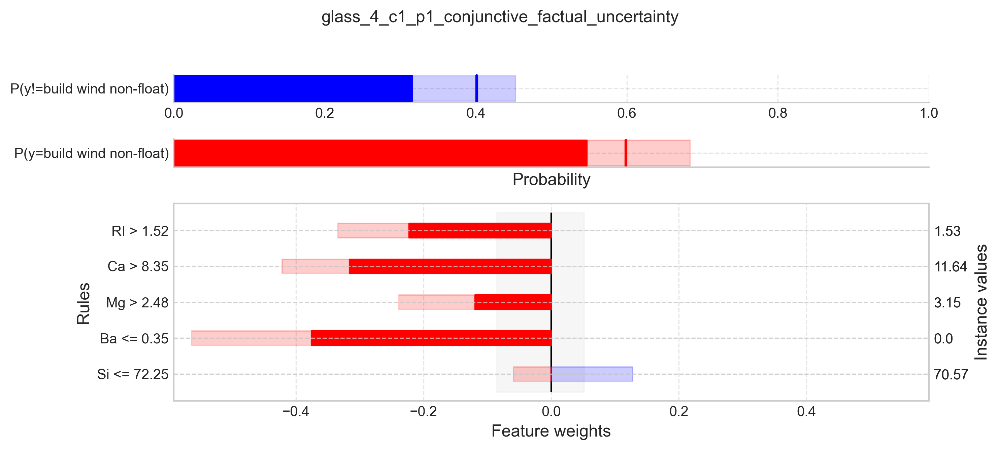

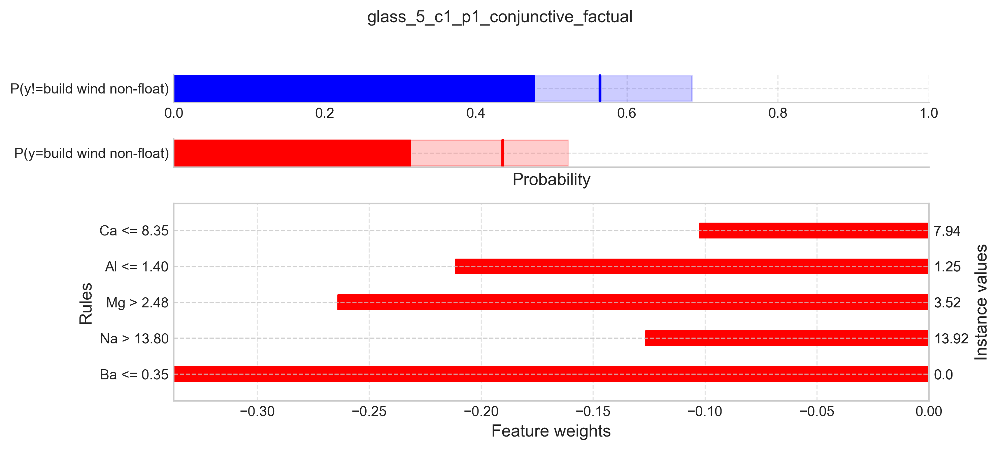

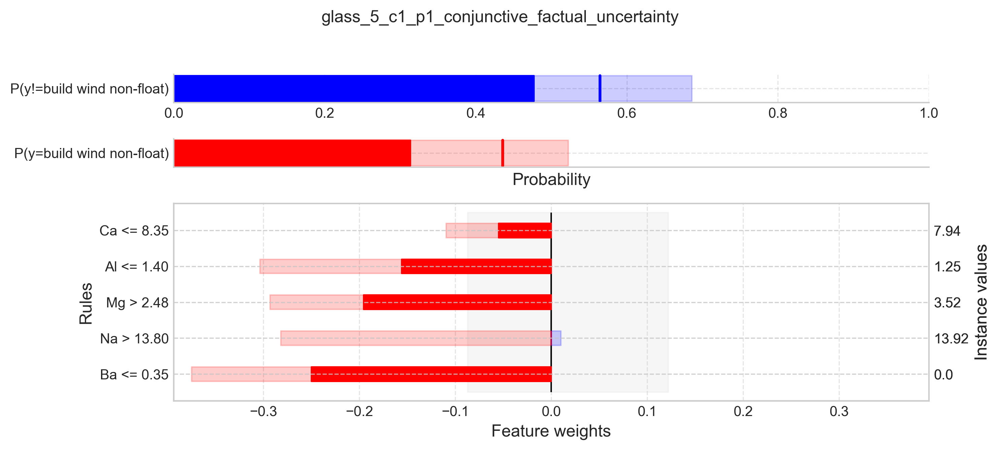

In [ ]:
factual_explanations.add_conjunctions()
for i in range(num_to_test):
    explanation = factual_explanations.get_explanation(i)
    explanation.plot(
        filter_top=5,
        filename=f"{dataset}_{i}_c{y_test[i]}_p{predicted_classes[i]}_conjunctive_factual.png",
        show=True,
    )
    explanation.plot(
        uncertainty=True,
        filter_top=5,
        filename=f"{dataset}_{i}_c{y_test[i]}_p{predicted_classes[i]}_conjunctive_factual_uncertainty.png",
        show=True,
    )

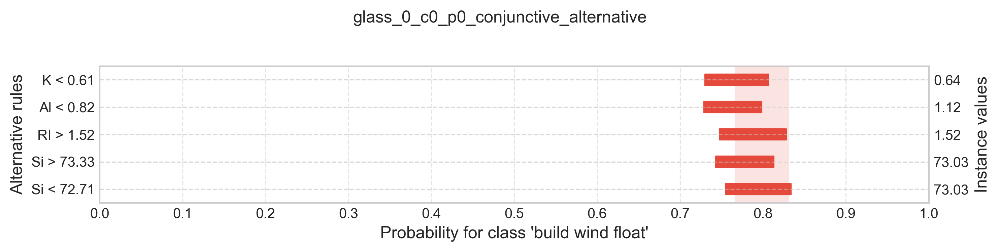

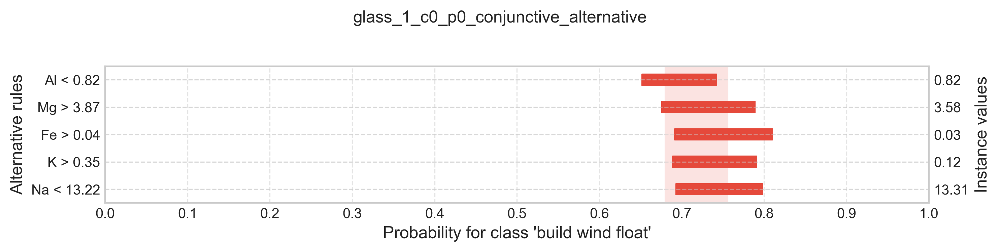

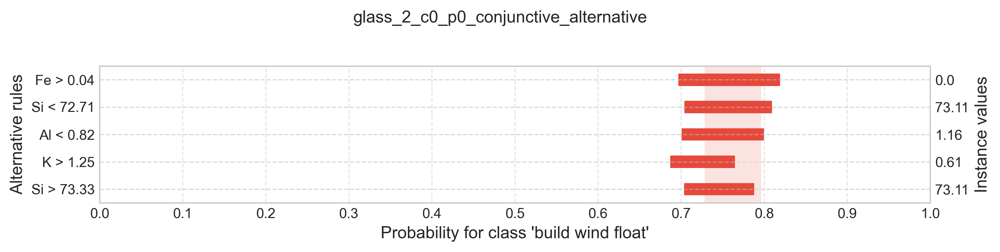

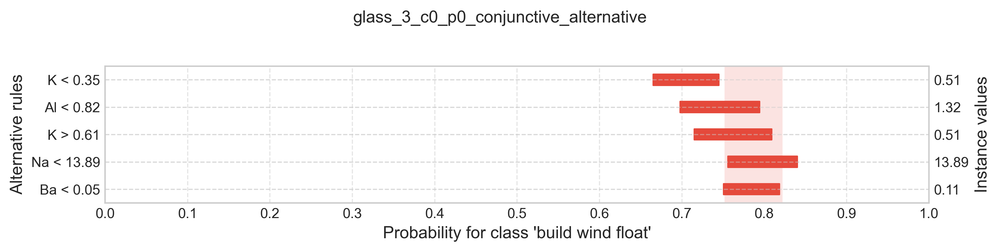

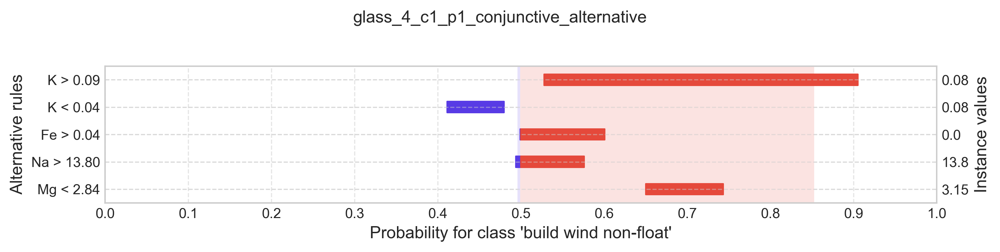

...

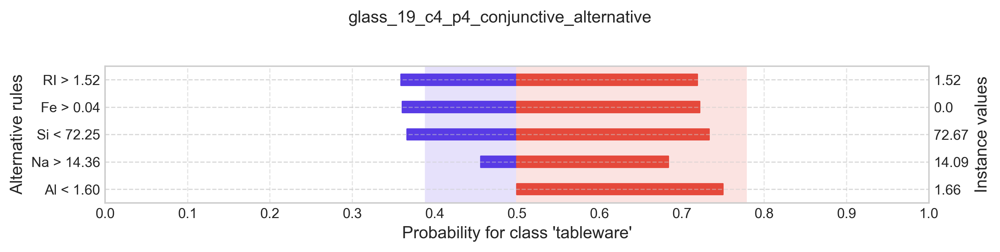

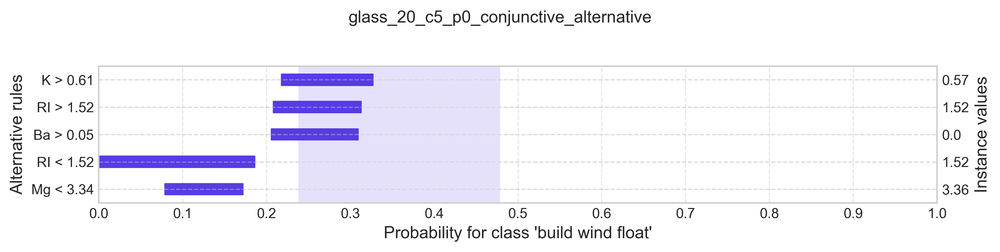

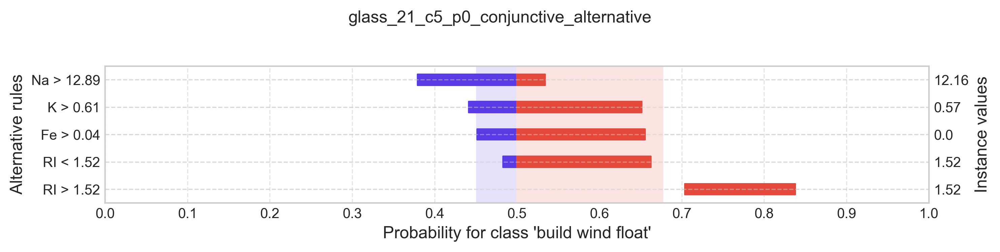

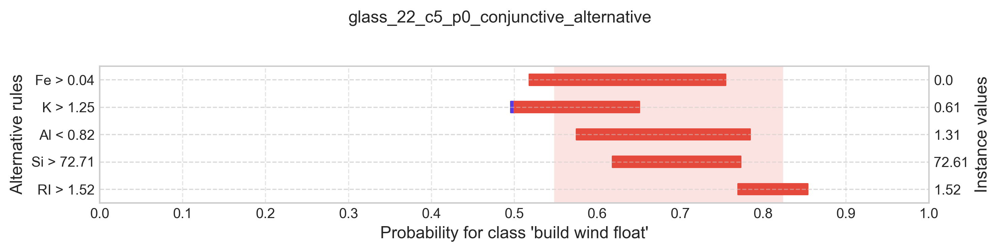

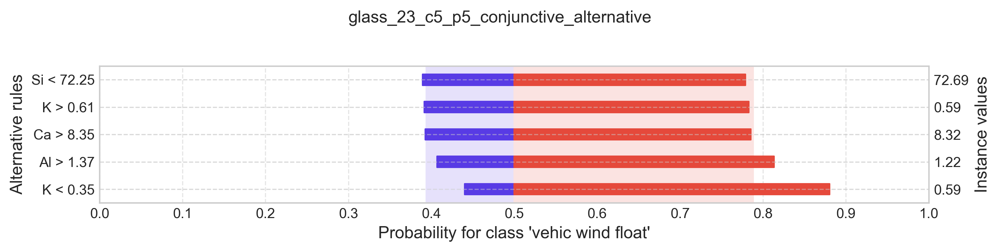

In [ ]:
alternative_explanations.add_conjunctions()
for i in range(num_to_test):
    explanation = alternative_explanations.get_explanation(i)
    explanation.plot(
        filter_top=5,
        filename=f"{dataset}_{i}_c{y_test[i]}_p{predicted_classes[i]}_conjunctive_alternative.png",
        show=True,
    )